In [162]:
import matplotlib.pyplot as plt
import seaborn as sns;
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd

In [163]:
%matplotlib inline
sns.set_theme()

In [164]:
# Load the dataset
df = pd.read_csv("train.csv")
pd.set_option("display.max_columns", None)
print(df.head())
print(df.describe())
print(df.info())
print(df.columns)


   Unnamed: 0  Tank Failure Pressure (bar)  Liquid Ratio  Tank Width (m)  \
0      3203.0                        14.26          0.25            1.58   
1      3204.0                        14.14          0.25            1.59   
2      3205.0                        14.05          0.24            1.62   
3      3206.0                        14.17          0.24            1.59   
4      3207.0                        14.09          0.24            1.59   

   Tank Length (m)  Tank Height (m)  BLEVE Height (m)  Vapour Height (m)  \
0             8.61             1.79              1.01               1.40   
1             8.58             1.81              1.00               1.41   
2             8.59             1.79              0.98               1.38   
3             8.60             1.80              0.98               1.40   
4             8.60             1.80              1.00               1.40   

   Vapour Temperature (K)  Liquid Temperature (K)  \
0                  457.14        

In [165]:
def showHistogram(df):
    # Show the histogram of the data
    df.hist(figsize=(40,20), bins=30, edgecolor='black', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [166]:
def showCategoricalData(df):
    # For categorical data, show the count of each category
    for col in df.columns:
        if df[col].dtype == 'object':
            print(df[col].value_counts())

In [167]:
# Load the dataset
df_test = pd.read_csv("test.csv")
print(df_test.head())
print(df_test.describe())
print(df_test.info())
print(df_test.columns)

   Unnamed: 0  Tank Failure Pressure (bar)  Liquid Ratio  Tank Width (m)  \
0           0                         37.9      0.412227             0.8   
1           1                         37.9      0.412227             0.8   
2           2                         37.9      0.412227             0.8   
3           3                         37.9      0.412227             0.8   
4           4                         37.9      0.412227             0.8   

   Tank Length (m)  Tank Height (m)  BLEVE Height (m)  Vapour Height (m)  \
0              6.6              0.4               0.8                0.2   
1              6.6              0.4               0.8                0.2   
2              6.6              0.4               0.8                0.2   
3              6.6              0.4               0.8                0.2   
4              6.6              0.4               0.8                0.2   

   Vapour Temperature (K)  Liquid Temperature (K)  \
0                   317.6        

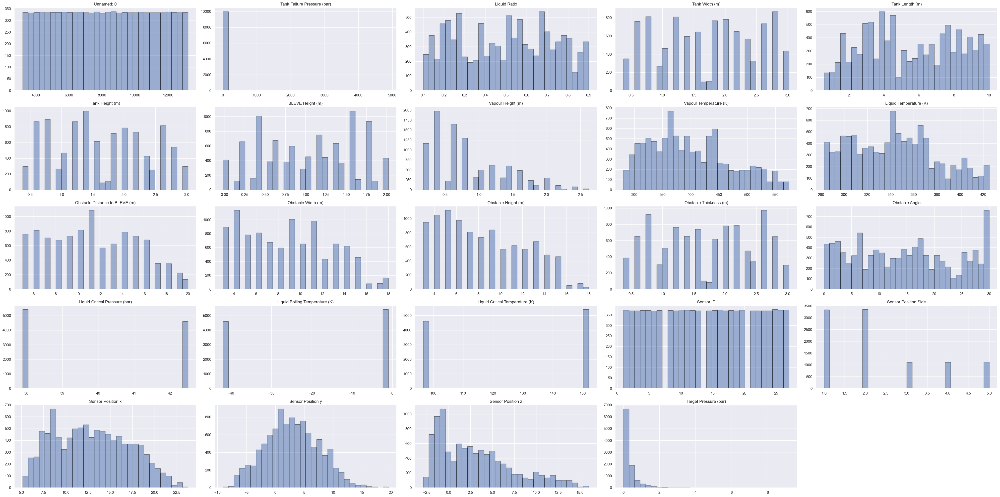

Status
Subcooled      6208
Superheated    3754
subcooled        23
Subcool          17
Subcoled         14
Saperheated      10
superheated       9
Superheat         7
Name: count, dtype: int64


In [168]:
showHistogram(df)
showCategoricalData(df)


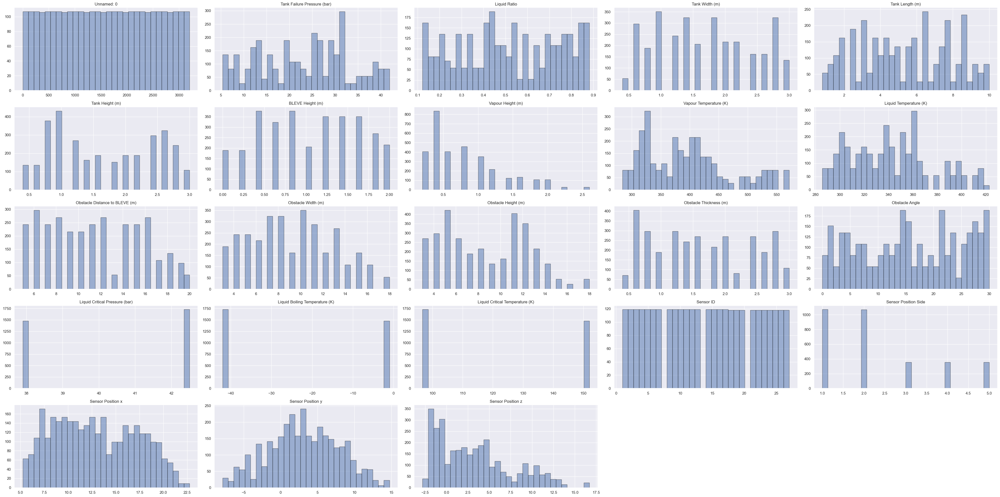

Status
Subcooled      1971
Superheated    1232
Name: count, dtype: int64


In [169]:
showHistogram(df_test)
showCategoricalData(df_test)

In [170]:
def updateCategoricalData(df):
    # Update the incorrect categorical data
    # Align the categorical data to Subcooled, Superheated
    COL_STATUS = 'Status'
    VAL_SUBCOOLED = 'Subcooled'
    VAL_SUPERHEATED = 'Superheated'
    df[COL_STATUS] = df[COL_STATUS].replace('subcooled', VAL_SUBCOOLED)
    df[COL_STATUS] = df[COL_STATUS].replace('Subcool', VAL_SUBCOOLED)
    df[COL_STATUS] = df[COL_STATUS].replace('Subcoled', VAL_SUBCOOLED)
    df[COL_STATUS] = df[COL_STATUS].replace('Saperheated', VAL_SUPERHEATED)
    df[COL_STATUS] = df[COL_STATUS].replace('superheated', VAL_SUPERHEATED)
    df[COL_STATUS] = df[COL_STATUS].replace('Superheat', VAL_SUPERHEATED)


In [171]:
updateCategoricalData(df)
showCategoricalData(df)

Status
Subcooled      6262
Superheated    3780
Name: count, dtype: int64


In [172]:
def handleMissingValues(df):
    # Check for missing values
    print(df.isnull().sum())
    print(df.info())
    # Drop rows with missing values
    df.dropna(inplace=True, axis=0)
    # Reset index
    df.reset_index(drop=True, inplace=True)
    print(df.info())

In [173]:
handleMissingValues(df)
handleMissingValues(df_test)

Unnamed: 0                          7
Tank Failure Pressure (bar)        10
Liquid Ratio                        9
Tank Width (m)                      7
Tank Length (m)                     5
Tank Height (m)                     8
BLEVE Height (m)                   10
Vapour Height (m)                   9
Vapour Temperature (K)             28
Liquid Temperature (K)             28
Obstacle Distance to BLEVE (m)      8
Obstacle Width (m)                  8
Obstacle Height (m)                 8
Obstacle Thickness (m)              8
Obstacle Angle                      8
Status                              8
Liquid Critical Pressure (bar)     28
Liquid Boiling Temperature (K)     27
Liquid Critical Temperature (K)    29
Sensor ID                           8
Sensor Position Side               10
Sensor Position x                   7
Sensor Position y                   9
Sensor Position z                   7
Target Pressure (bar)               6
dtype: int64
<class 'pandas.core.frame.DataFrame'>

In [174]:
def dropUnusedColumns(df, columns):
    # Drop unused columns
    try:
        df.drop(columns=columns, inplace=True)
    except KeyError as e:
        print(e)
    print(df.info())


In [175]:
unused_cols = ['Unnamed: 0']
dropUnusedColumns(df, unused_cols)
dropUnusedColumns(df_test, unused_cols)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9940 entries, 0 to 9939
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tank Failure Pressure (bar)      9940 non-null   float64
 1   Liquid Ratio                     9940 non-null   float64
 2   Tank Width (m)                   9940 non-null   float64
 3   Tank Length (m)                  9940 non-null   float64
 4   Tank Height (m)                  9940 non-null   float64
 5   BLEVE Height (m)                 9940 non-null   float64
 6   Vapour Height (m)                9940 non-null   float64
 7   Vapour Temperature (K)           9940 non-null   float64
 8   Liquid Temperature (K)           9940 non-null   float64
 9   Obstacle Distance to BLEVE (m)   9940 non-null   float64
 10  Obstacle Width (m)               9940 non-null   float64
 11  Obstacle Height (m)              9940 non-null   float64
 12  Obstacle Thickness (

In [176]:
def removeDuplicates(df):
    # Remove duplicates
    df.drop_duplicates(inplace=True)
    print(df.info())

In [177]:
removeDuplicates(df)

<class 'pandas.core.frame.DataFrame'>
Index: 9890 entries, 0 to 9889
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tank Failure Pressure (bar)      9890 non-null   float64
 1   Liquid Ratio                     9890 non-null   float64
 2   Tank Width (m)                   9890 non-null   float64
 3   Tank Length (m)                  9890 non-null   float64
 4   Tank Height (m)                  9890 non-null   float64
 5   BLEVE Height (m)                 9890 non-null   float64
 6   Vapour Height (m)                9890 non-null   float64
 7   Vapour Temperature (K)           9890 non-null   float64
 8   Liquid Temperature (K)           9890 non-null   float64
 9   Obstacle Distance to BLEVE (m)   9890 non-null   float64
 10  Obstacle Width (m)               9890 non-null   float64
 11  Obstacle Height (m)              9890 non-null   float64
 12  Obstacle Thickness (m)   

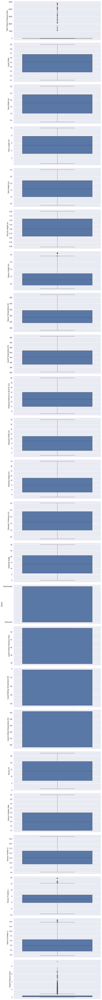

In [178]:
# Combine all plots into one
fig, axs = plt.subplots(len(df.columns), 1, figsize=(10, 4 * len(df.columns)))
for i, col in enumerate(df.columns):
    sns.boxplot(df[col], ax=axs[i])
plt.tight_layout()
plt.show()

In [179]:
def handleOutliers(df):
    # Check for outliers
    print(df.describe())
    print(df.info())
    # Drop outliers which 'Tank Failure Pressure (bar)' is more than 50 bar
    col = 'Tank Failure Pressure (bar)'
    df = df[df[col] < 50]
    print(df.info())


In [180]:
handleOutliers(df)

       Tank Failure Pressure (bar)  Liquid Ratio  Tank Width (m)  \
count                  9890.000000   9890.000000     9890.000000   
mean                     37.448713      0.494590        1.725327   
std                     228.957423      0.227219        0.763109   
min                       4.890000      0.100000        0.380000   
25%                      13.190000      0.280000        1.010000   
50%                      21.400000      0.510000        1.790000   
75%                      32.830000      0.680000        2.400000   
max                    4882.573607      0.900000        3.020000   

       Tank Length (m)  Tank Height (m)  BLEVE Height (m)  Vapour Height (m)  \
count      9890.000000      9890.000000       9890.000000        9890.000000   
mean          5.528005         1.641220          1.029584           0.855672   
std           2.631124         0.729045          0.572556           0.537618   
min           0.580000         0.380000         -0.020000          

In [181]:

# Data preprocessing
# Convert categorical variables to numerical
def encodeCategoricalData(df):
    dummy_cols = ['Status', 'Liquid Critical Pressure (bar)', 'Liquid Boiling Temperature (K)', 'Liquid Critical Temperature (K)']
    print('Columns in original data frame:\n', df.columns.values)
    print('\nNumber of rows and columns in the dataset:', df.shape)
    df_encode = pd.get_dummies(data=df, prefix='dummy', prefix_sep='_', columns=dummy_cols, drop_first=True, dtype='int8')
    print('\nColumns in data frame after encoding dummy variable:\n', df_encode.columns.values)
    print('\nNumber of rows and columns in the dataset:', df_encode.shape)
    return df_encode


In [182]:
df_encode = encodeCategoricalData(df)
print(df_encode.head())

Columns in original data frame:
 ['Tank Failure Pressure (bar)' 'Liquid Ratio' 'Tank Width (m)'
 'Tank Length (m)' 'Tank Height (m)' 'BLEVE Height (m)'
 'Vapour Height (m)' 'Vapour Temperature (K)' 'Liquid Temperature (K)'
 'Obstacle Distance to BLEVE (m)' 'Obstacle Width (m)'
 'Obstacle Height (m)' 'Obstacle Thickness (m)' 'Obstacle Angle' 'Status'
 'Liquid Critical Pressure (bar)' 'Liquid Boiling Temperature (K)'
 'Liquid Critical Temperature (K)' 'Sensor ID' 'Sensor Position Side'
 'Sensor Position x' 'Sensor Position y' 'Sensor Position z'
 'Target Pressure (bar)']

Number of rows and columns in the dataset: (9890, 24)

Columns in data frame after encoding dummy variable:
 ['Tank Failure Pressure (bar)' 'Liquid Ratio' 'Tank Width (m)'
 'Tank Length (m)' 'Tank Height (m)' 'BLEVE Height (m)'
 'Vapour Height (m)' 'Vapour Temperature (K)' 'Liquid Temperature (K)'
 'Obstacle Distance to BLEVE (m)' 'Obstacle Width (m)'
 'Obstacle Height (m)' 'Obstacle Thickness (m)' 'Obstacle Angle'
 'Se

In [200]:
df_test.info()

# Convert df_test all int64 columns to float64, except object columns
df_test = df_test.astype({col: 'float64' for col in df_test.columns if df_test[col].dtype == 'int64'})
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3203 entries, 0 to 3202
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Tank Failure Pressure (bar)      3203 non-null   float64
 1   Liquid Ratio                     3203 non-null   float64
 2   Tank Width (m)                   3203 non-null   float64
 3   Tank Length (m)                  3203 non-null   float64
 4   Tank Height (m)                  3203 non-null   float64
 5   BLEVE Height (m)                 3203 non-null   float64
 6   Vapour Height (m)                3203 non-null   float64
 7   Vapour Temperature (K)           3203 non-null   float64
 8   Liquid Temperature (K)           3203 non-null   float64
 9   Obstacle Distance to BLEVE (m)   3203 non-null   int64  
 10  Obstacle Width (m)               3203 non-null   int64  
 11  Obstacle Height (m)              3203 non-null   int64  
 12  Obstacle Thickness (

In [201]:
df_test_encode = encodeCategoricalData(df_test)
print(df_test_encode.head())

Columns in original data frame:
 ['Tank Failure Pressure (bar)' 'Liquid Ratio' 'Tank Width (m)'
 'Tank Length (m)' 'Tank Height (m)' 'BLEVE Height (m)'
 'Vapour Height (m)' 'Vapour Temperature (K)' 'Liquid Temperature (K)'
 'Obstacle Distance to BLEVE (m)' 'Obstacle Width (m)'
 'Obstacle Height (m)' 'Obstacle Thickness (m)' 'Obstacle Angle' 'Status'
 'Liquid Critical Pressure (bar)' 'Liquid Boiling Temperature (K)'
 'Liquid Critical Temperature (K)' 'Sensor ID' 'Sensor Position Side'
 'Sensor Position x' 'Sensor Position y' 'Sensor Position z']

Number of rows and columns in the dataset: (3203, 23)

Columns in data frame after encoding dummy variable:
 ['Tank Failure Pressure (bar)' 'Liquid Ratio' 'Tank Width (m)'
 'Tank Length (m)' 'Tank Height (m)' 'BLEVE Height (m)'
 'Vapour Height (m)' 'Vapour Temperature (K)' 'Liquid Temperature (K)'
 'Obstacle Distance to BLEVE (m)' 'Obstacle Width (m)'
 'Obstacle Height (m)' 'Obstacle Thickness (m)' 'Obstacle Angle'
 'Sensor ID' 'Sensor Position

In [184]:
# Feature extraction
# Extract features from the dataset
COL_TARGET = 'Target Pressure (bar)'
X_train = df_encode.drop(columns=[COL_TARGET], axis=1)
y_train = df_encode[COL_TARGET]

# Split the dataset into training and testing sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


In [185]:

# Visualize of predictions
def visualizePredictions(y_test, y_pred):
    vis = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
    plt.plot(vis[:200])
    plt.legend(['Actual', 'Predicted'])
    plt.show()

Linear regression without Standardization on X: |r2: 0.44|mse: 1.34e-01|


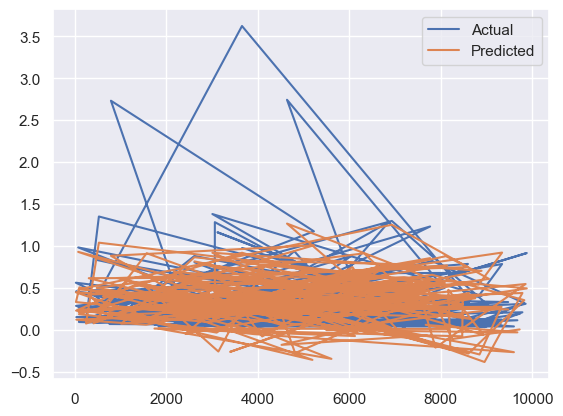

In [186]:
from sklearn.metrics import r2_score, mean_squared_error
# Linear regression without further preprocessing
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print("Linear regression without Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
visualizePredictions(y_test, y_pred)

Linear regression with Standardization on X: |r2: 0.44|mse: 1.34e-01|


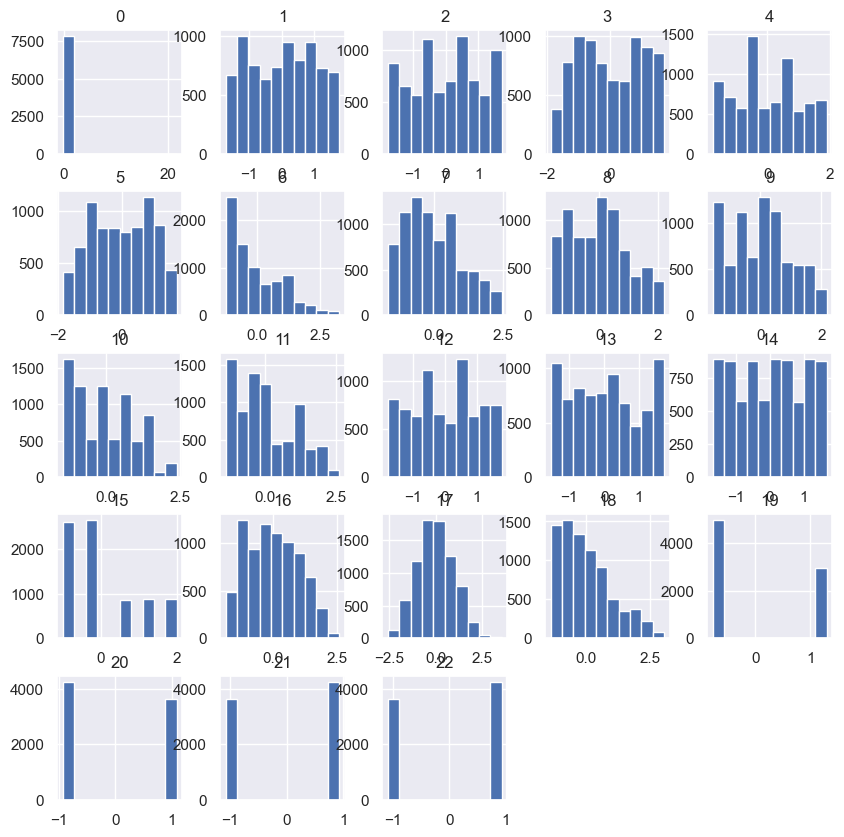

In [187]:
# Linear regression with feature standardization
from sklearn.preprocessing import StandardScaler
transformer = StandardScaler().fit(X_train)
X_train_normalized = transformer.transform(X_train)
X_test_normalized = transformer.transform(X_test)
df_stdscal = pd.DataFrame(X_train_normalized)
df_stdscal.hist(figsize = (10,10), bins=10)

model = LinearRegression()
model.fit(X_train_normalized, y_train)
y_pred = model.predict(X_test_normalized)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
print("Linear regression with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
visualizePredictions(y_test, y_pred)

C:\Users\BenNiu\AppData\Local\Temp\ipykernel_17012\1591877885.py:12: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_train, bins=50, color='r', ax=ax)
C:\Users\BenNiu\AppData\Local\Temp\ipykernel_17012\1591877885.py:15: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_train_normal, bins=50, color

<Axes: ylabel='Density'>

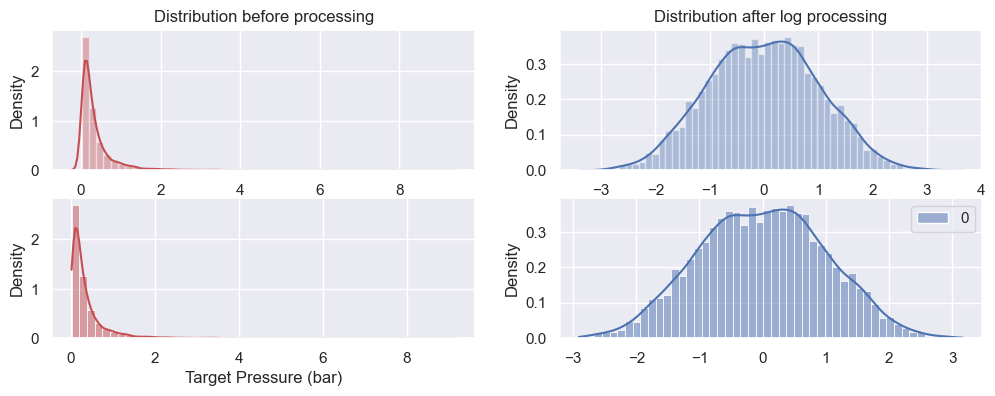

In [188]:
# Coverting target output to normal distribution
from sklearn.preprocessing import PowerTransformer

y_train_2d = y_train.to_numpy().reshape(-1, 1)
y_test_2d = y_test.to_numpy().reshape(-1, 1)
pt = PowerTransformer(method='box-cox').fit(y_train_2d)
y_train_normal = pt.transform(y_train_2d)
y_test_normal = pt.transform(y_test_2d)

f = plt.figure(figsize=(12, 4))
ax = f.add_subplot(221)
sns.distplot(y_train, bins=50, color='r', ax=ax)
ax.set_title('Distribution before processing')
ax = f.add_subplot(222)
sns.distplot(y_train_normal, bins=50, color='b', ax=ax)
ax.set_title('Distribution after log processing')

ax = f.add_subplot(223)
sns.histplot(y_train, bins=50, color='r', ax=ax, kde=True, stat="density")
ax = f.add_subplot(224)
sns.histplot(y_train_normal, bins=50, color='b', ax=ax, kde=True, stat="density")

Linear regression without Standardization on X: |r2: 0.79|mse: 2.10e-01|
(7912, 23) (7912, 1) (1978, 23) (1978, 1)
0
0
Linear regression without Standardization on X: |r2: 0.53|mse: 1.12e-01|


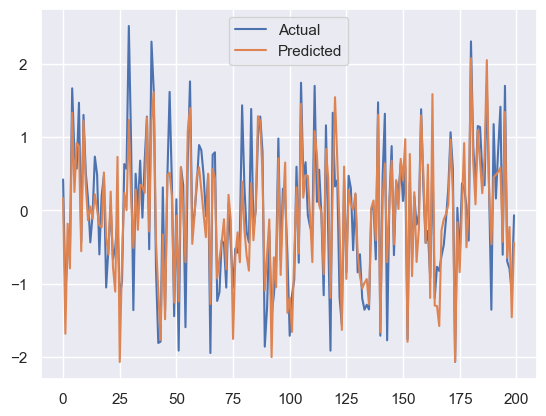

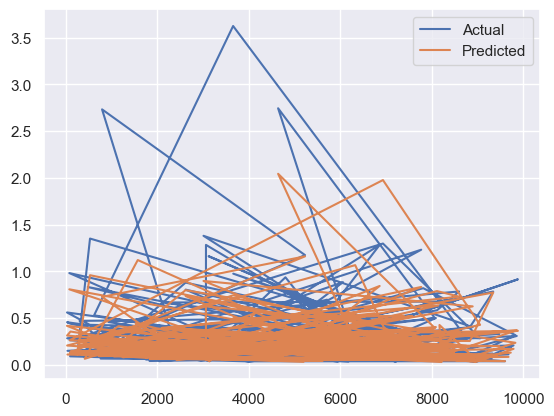

In [189]:
# Linear regression with normal-distribution target
model = LinearRegression()
model.fit(X_train, y_train_normal)
y_pred_normal = model.predict(X_test)
# Evaluate the performance and see if it improves
r2 = r2_score(y_test_normal, y_pred_normal)
mse = mean_squared_error(y_test_normal, y_pred_normal)
print("Linear regression without Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
print(X_train.shape, y_train_normal.shape, X_test.shape, y_pred_normal.shape)
y_pred_rec = pt.inverse_transform(y_pred_normal)
# check y_pred and y_pred_rec has nan values
print(np.isnan(y_pred_normal).sum())
print(np.isnan(y_pred_rec).sum())
r2 = r2_score(y_test, y_pred_rec)
mse = mean_squared_error(y_test, y_pred_rec)
print("Linear regression without Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
visualizePredictions(y_test_normal, y_pred_normal)
visualizePredictions(y_test, y_pred_rec)

Linear regression with Standardization on X: |r2: 0.79|mse: 2.10e-01|
0
0
Linear regression with Standardization on X: |r2: 0.53|mse: 1.12e-01|


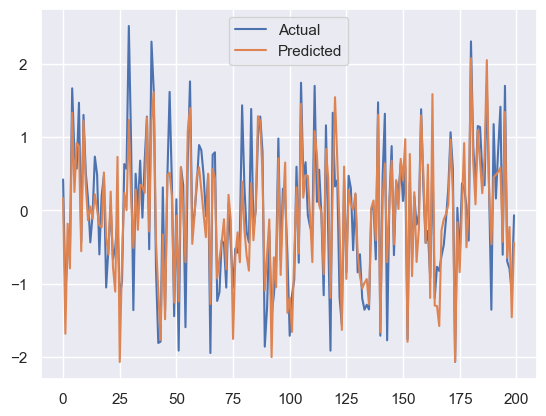

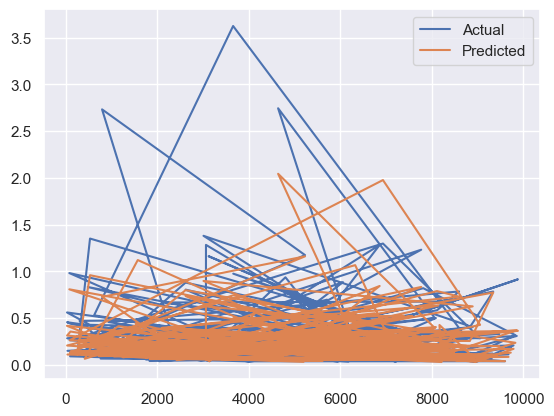

In [190]:
# Linear regression with normal-distribution target
model = LinearRegression()
model.fit(X_train_normalized, y_train_normal)
y_pred_normal = model.predict(X_test_normalized)
# Evaluate the performance and see if it improves
r2 = r2_score(y_test_normal, y_pred_normal)
mse = mean_squared_error(y_test_normal, y_pred_normal)
print("Linear regression with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
y_pred_rec = pt.inverse_transform(y_pred_normal)
# check y_pred and y_pred_rec has nan values
print(np.isnan(y_pred_normal).sum())
print(np.isnan(y_pred_rec).sum())
r2 = r2_score(y_test, y_pred_rec)
mse = mean_squared_error(y_test, y_pred_rec)
print("Linear regression with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
visualizePredictions(y_test_normal, y_pred_normal)
visualizePredictions(y_test, y_pred_rec)

Linear regression(Lasso) with Standardization on X: |r2: 0.38|mse: 6.19e-01|
weights: [ 0.         -0.          0.05482923  0.11597559  0.04571488 -0.
  0.13312195 -0.          0.         -0.         -0.02138725 -0.
 -0.          0.          0.20645157 -0.         -0.17913609 -0.20199821
 -0.11552992 -0.          0.         -0.         -0.        ]
(7912, 23) (7912, 1) (1978, 23) (1978,)
0
0
Linear regression(Lasso) with Standardization on X: |r2: 0.08|mse: 2.18e-01|


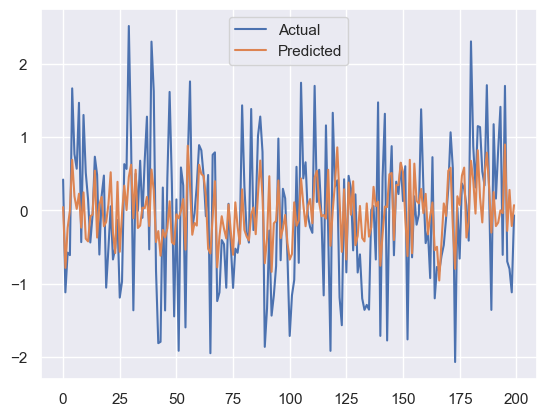

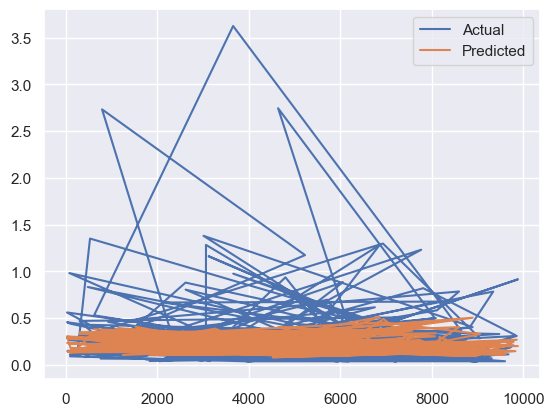

In [191]:
# Lasso
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.1)
model.fit(X_train_normalized, y_train_normal)
y_pred_normal = model.predict(X_test_normalized)
r2 = r2_score(y_test_normal, y_pred_normal)
mse = mean_squared_error(y_test_normal, y_pred_normal)
print("Linear regression(Lasso) with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
print("weights:", model.coef_)

print(X_train_normalized.shape, y_train_normal.shape, X_test_normalized.shape, y_pred_normal.shape)

y_pred_rec = pt.inverse_transform(y_pred_normal.reshape(-1, 1))
# check y_pred and y_pred_rec has nan values
print(np.isnan(y_pred_normal).sum())
print(np.isnan(y_pred_rec).sum())
r2 = r2_score(y_test, y_pred_rec)
mse = mean_squared_error(y_test, y_pred_rec)
print("Linear regression(Lasso) with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))

visualizePredictions(y_test_normal, y_pred_normal)
visualizePredictions(y_test, y_pred_rec)

d:\Work\ML\Curtin_CS_25_1_COMP6013_Explainable_Approaches_to_Machine_Learning\.venv\Lib\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Random Forest with Standardization on X: |r2: 0.87|mse: 1.26e-01|
(7912, 23) (7912, 1) (1978, 23) (1978,)
0
0
Random Forest with Standardization on X: |r2: 0.62|mse: 8.97e-02|
[2.97071456e-02 1.35648114e-03 2.16635300e-02 5.37493091e-02
 6.09073306e-03 3.64117537e-03 7.93318416e-02 1.10965181e-03
 2.26320034e-03 1.79175710e-02 9.98434441e-03 5.95046669e-03
 2.98708419e-03 2.31177760e-03 4.83762970e-01 1.82905119e-01
 2.40287191e-02 5.74611104e-02 1.30811225e-02 3.43068294e-04
 1.33285619e-04 1.07686972e-04 1.12606024e-04]


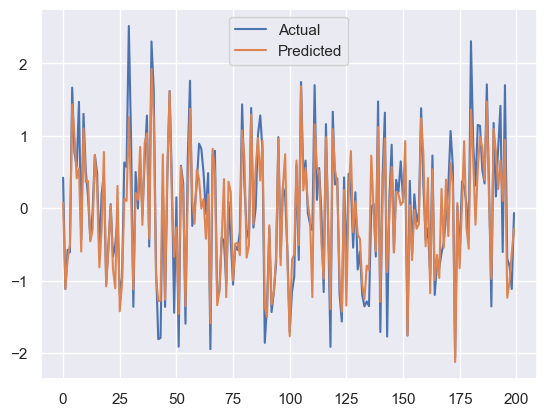

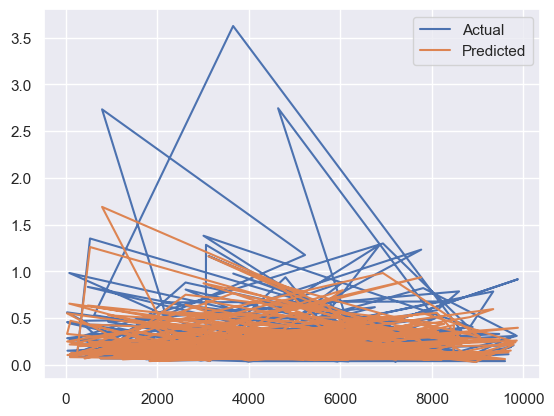

In [192]:
# RF
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=50, max_depth=7, random_state=42)
model.fit(X_train_normalized, y_train_normal)
y_pred_normal = model.predict(X_test_normalized)
r2 = r2_score(y_test_normal, y_pred_normal)
mse = mean_squared_error(y_test_normal, y_pred_normal)
print("Random Forest with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))

print(X_train_normalized.shape, y_train_normal.shape, X_test_normalized.shape, y_pred_normal.shape)

y_pred_rec = pt.inverse_transform(y_pred_normal.reshape(-1, 1))
# check y_pred and y_pred_rec has nan values
print(np.isnan(y_pred_normal).sum())
print(np.isnan(y_pred_rec).sum())
r2 = r2_score(y_test, y_pred_rec)
mse = mean_squared_error(y_test, y_pred_rec)
print("Random Forest with Standardization on X: |r2: {:.2f}|mse: {:.2e}|".format(r2, mse))
# Print the feature importance
print(model.feature_importances_)
visualizePredictions(y_test_normal, y_pred_normal)
visualizePredictions(y_test, y_pred_rec)

In [193]:
# %pip install shap


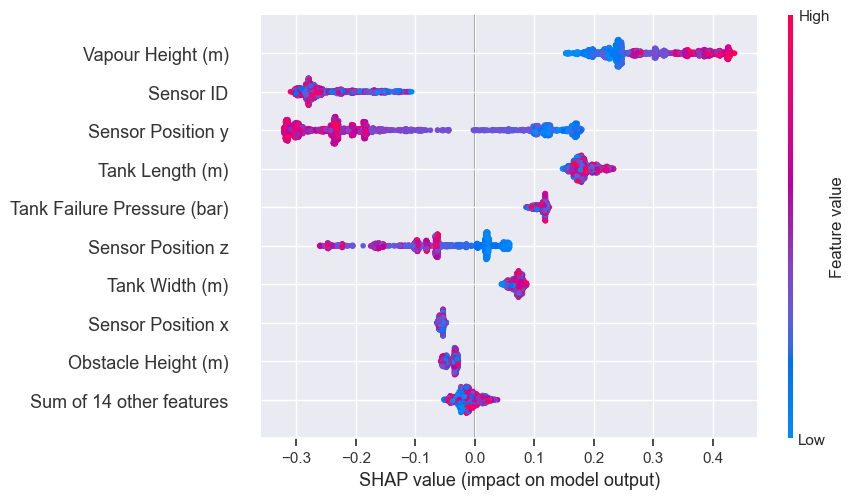

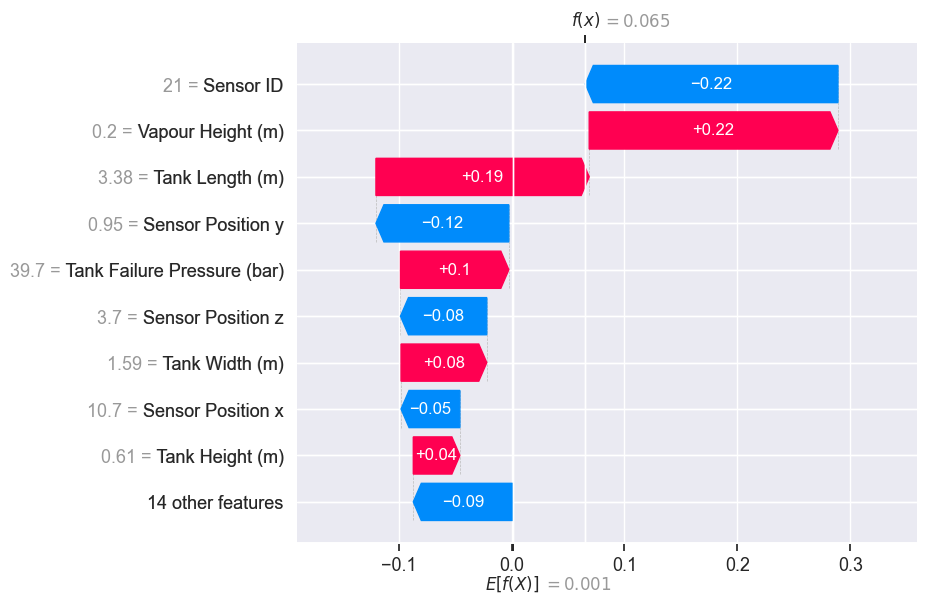

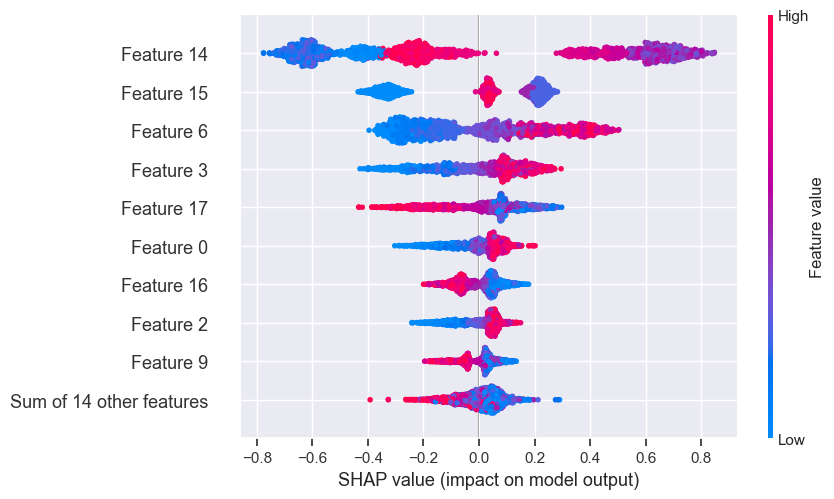

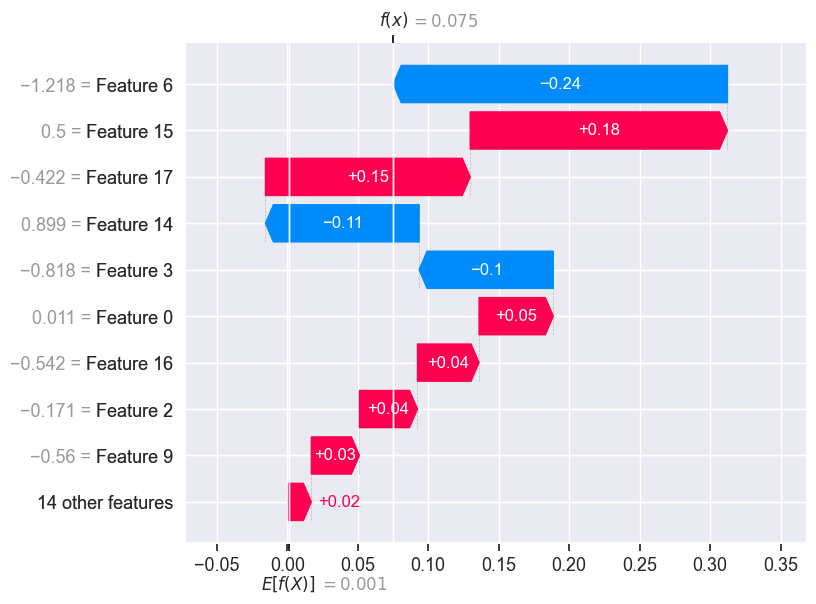

In [194]:
import shap

# For linear model
# explainer = shap.LinearExplainer(model, X_train_normalized)
# shap_values = explainer(X_test_normalized)
# shap.plots.beeswarm(shap_values)

# For Random forest
explainer = shap.Explainer(model)
shap_values = explainer(X_test)
shap.plots.beeswarm(shap_values)
shap.plots.waterfall(shap_values[0])

explainer = shap.Explainer(model)
shap_values = explainer(X_test_normalized)
shap.plots.beeswarm(shap_values)
shap.plots.waterfall(shap_values[0])


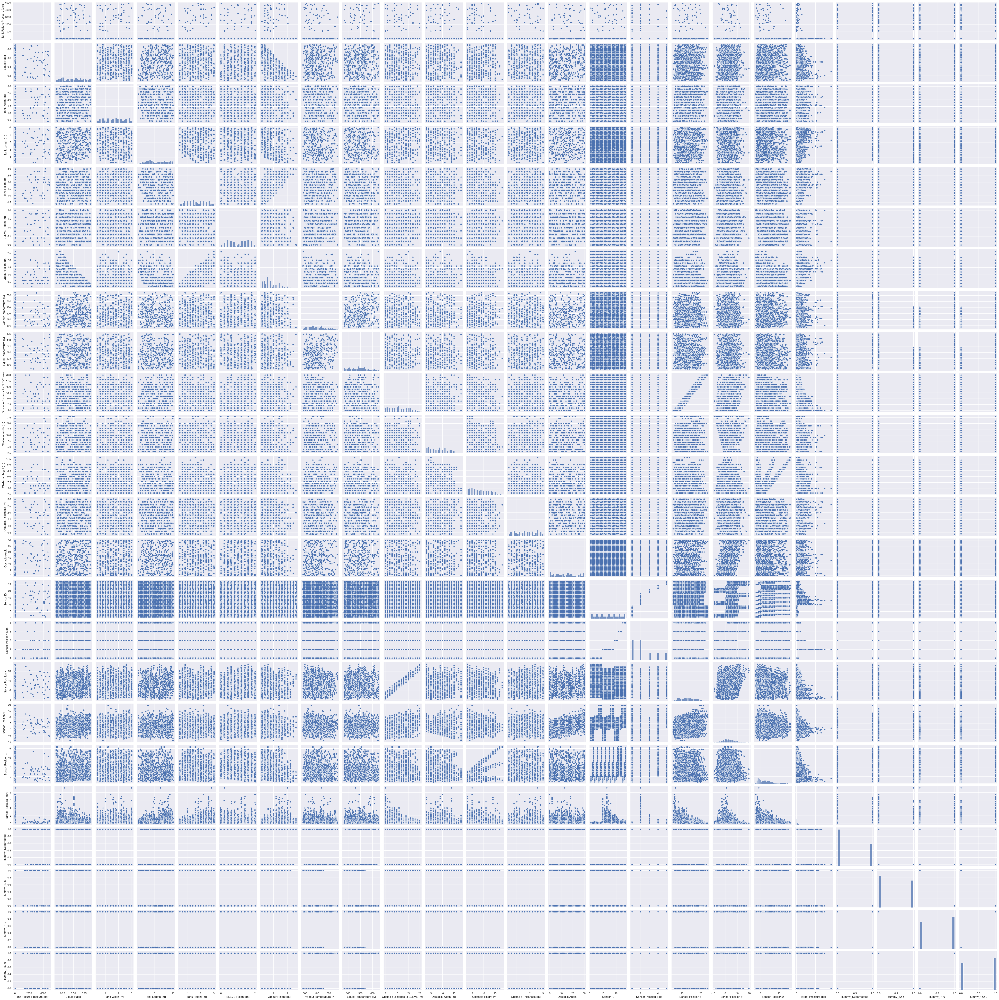

In [195]:

# Visualize the data
sns.pairplot(df_encode)
plt.show()

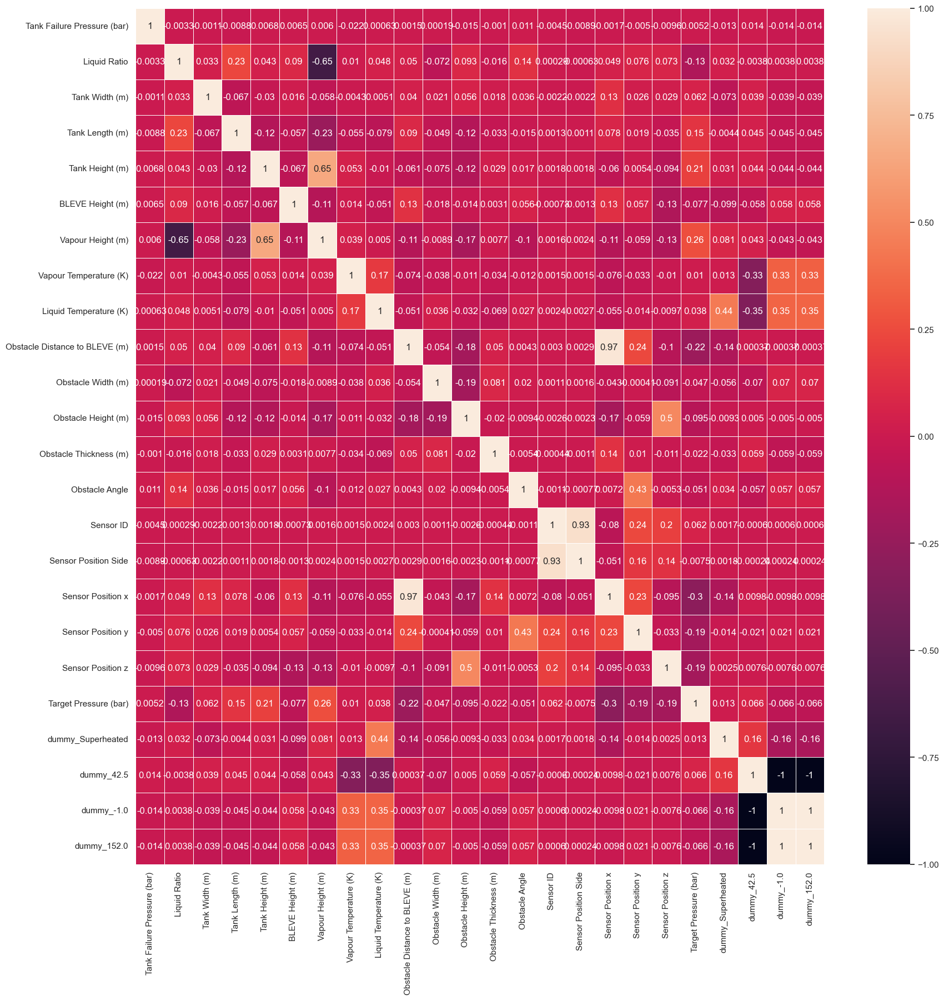

In [196]:
# create bigger size heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(df_encode.corr(), annot=True, linewidths=0.5)
plt.show()



In [197]:
print(X_train[:5])
print(df_test_encode[:5])

      Tank Failure Pressure (bar)  Liquid Ratio  Tank Width (m)  \
3328                        18.14          0.41            0.80   
2510                        29.00          0.11            2.82   
7697                        35.84          0.83            1.22   
6408                        36.87          0.24            0.39   
6839                         6.74          0.34            2.98   

      Tank Length (m)  Tank Height (m)  BLEVE Height (m)  Vapour Height (m)  \
3328             1.81             1.19              1.60               0.80   
2510             1.82             1.21              1.81               0.99   
7697             5.00             1.38              1.41               0.20   
6408             6.41             1.82              0.60               1.39   
6839             8.80             0.60              1.22               0.40   

      Vapour Temperature (K)  Liquid Temperature (K)  \
3328                  396.40                  374.10   
2510      

In [205]:

X_normalized = transformer.transform(df_test_encode)
print(X_normalized.shape)

y_normal = model.predict(X_normalized)

y_rec = pt.inverse_transform(y_normal.reshape(-1, 1))
# check y_pred and y_pred_rec has nan values
print(np.isnan(y_normal).sum())
print(np.isnan(y_rec).sum())
print(y_normal[:10])
print(y_rec[:10])
print(y_rec.reshape(-1)[:10])




(3203, 23)
0
0
[-0.80616251 -0.80616251 -0.80737817 -1.51491105 -1.5697716  -1.5697716
 -1.57687904 -1.57687904 -1.56284409  1.13850333]
[[0.09395824]
 [0.09395824]
 [0.09385424]
 [0.05031633]
 [0.04802279]
 [0.04802279]
 [0.04773421]
 [0.04773421]
 [0.04830592]
 [0.66920809]]
[0.09395824 0.09395824 0.09385424 0.05031633 0.04802279 0.04802279
 0.04773421 0.04773421 0.04830592 0.66920809]


In [207]:
# Write result to csv
# Create a output dataframe, ID is the index of df_test_encode, COL_TARGET is the predicted value
df_output = pd.DataFrame({'ID': df_test_encode.index, COL_TARGET: y_rec.reshape(-1)})
print(df_output.head())
df_output.to_csv('result.csv', index=False)



   ID  Target Pressure (bar)
0   0               0.093958
1   1               0.093958
2   2               0.093854
3   3               0.050316
4   4               0.048023
